In [1]:
library(Seurat)
library(dplyr)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
folder_path <- "/data2/ZenNa/DFU_Project/Data/Footskin"
csv_files <- list.files(path = folder_path, pattern = "\\.csv$", full.names = TRUE)

In [3]:
# Init seurat object list
seurat_object_list <- list()

In [4]:
for (csv_file in csv_files) {
  # Read the CSV file into a data frame
  dataset <- read.csv(csv_file)
  
  # Extract the sample name from the file name
  sample_name <- tools::file_path_sans_ext(basename(csv_file))
  
  # Create a Seurat object from the data frame
  seurat_obj <- CreateSeuratObject(counts = dataset, project = sample_name, min.cells = 3, min.features = 200)
  
  # Subset the Seurat object based on specific criteria
   seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")

  seurat_obj <- subset(seurat_obj, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 50)
  
  # Store the Seurat object in the list using the sample name as the key
  seurat_object_list[[sample_name]] <- seurat_obj
}

In [5]:
DFU_Data.list <- seurat_object_list

In [6]:
DFU_Data.list  <- lapply(X = DFU_Data.list, FUN = function(x) {
    x <- NormalizeData(x, verbose = FALSE)
    x <- FindVariableFeatures(x, verbose = FALSE)
})

In [7]:
features <- SelectIntegrationFeatures(object.list = DFU_Data.list)
DFU_Data.list <- lapply(X = DFU_Data.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

In [8]:
anchors <- FindIntegrationAnchors(object.list = DFU_Data.list, reference = c(1, 2), reduction = "rpca",
    dims = 1:50)
DFU_Data.integrated <- IntegrateData(anchorset = anchors, dims = 1:50)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1048 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 435 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 563 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 786 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1342 anchors

Projecting new data onto SVD

Projecting new data onto S

In [9]:
anchors <- FindIntegrationAnchors(object.list = DFU_Data.list, reference = c(1, 2), reduction = "rpca",
    dims = 1:50)
DFU_Data.integrated <- IntegrateData(anchorset = anchors, dims = 1:50)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1048 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 435 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 563 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 786 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1342 anchors

Projecting new data onto SVD

Projecting new data onto S

In [10]:
DFU_Data.integrated <- ScaleData(DFU_Data.integrated, verbose = FALSE)
DFU_Data.integrated <- RunPCA(DFU_Data.integrated, verbose = FALSE)
DFU_Data.integrated <- RunUMAP(DFU_Data.integrated, dims = 1:50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
20:26:34 UMAP embedding parameters a = 0.9922 b = 1.112

20:26:34 Read 63190 rows and found 50 numeric columns

20:26:34 Using Annoy for neighbor search, n_neighbors = 30

20:26:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

20:26:39 Writing NN index file to temp file /tmp/RtmpzimNaQ/file182cbd3fb15351

20:26:39 Searching Annoy index using 1 thread, search_k = 3000

20:26:56 Annoy recall = 100%

20:26:57 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbor

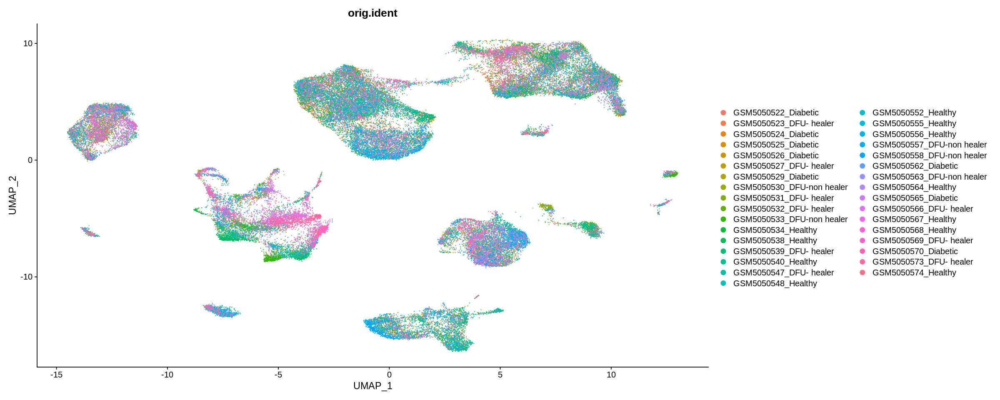

In [11]:
options(repr.plot.width = 20, repr.plot.height = 8)
DimPlot(DFU_Data.integrated, group.by = "orig.ident")

In [12]:
# Create a major_group column in the metadata
DFU_Data.integrated$major_group <- NA

# Assign major group labels based on patterns in orig.ident
DFU_Data.integrated$major_group[grep("_Diabetic$", DFU_Data.integrated$orig.ident)] <- "Diabetic"
DFU_Data.integrated$major_group[grep("_DFU- healer$", DFU_Data.integrated$orig.ident)] <- "DFU-Healer"
DFU_Data.integrated$major_group[grep("_Healthy$", DFU_Data.integrated$orig.ident)] <- "Healthy"
DFU_Data.integrated$major_group[grep("_DFU-non healer$", DFU_Data.integrated$orig.ident)] <- "DFU-Non Healer"
DFU_Data.integrated$major_group[is.na(DFU_Data.integrated$major_group)] <- "Other"

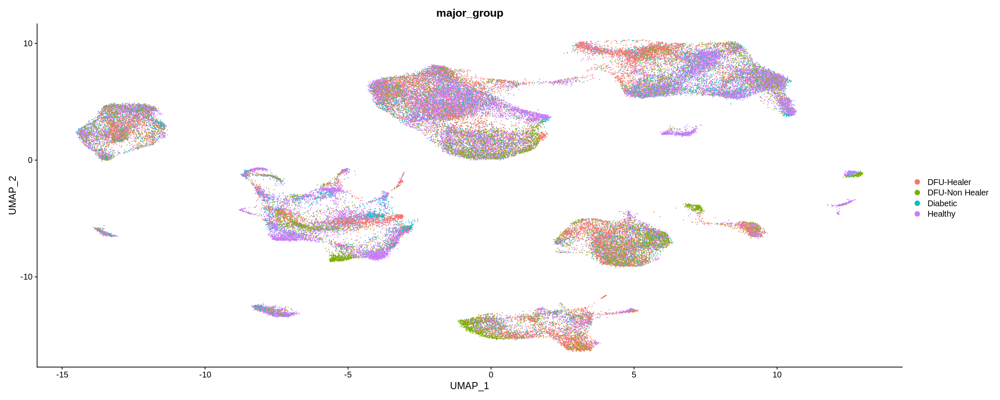

In [13]:
# Now, plot UMAP based on major groups
DimPlot(DFU_Data.integrated, group.by = "major_group")

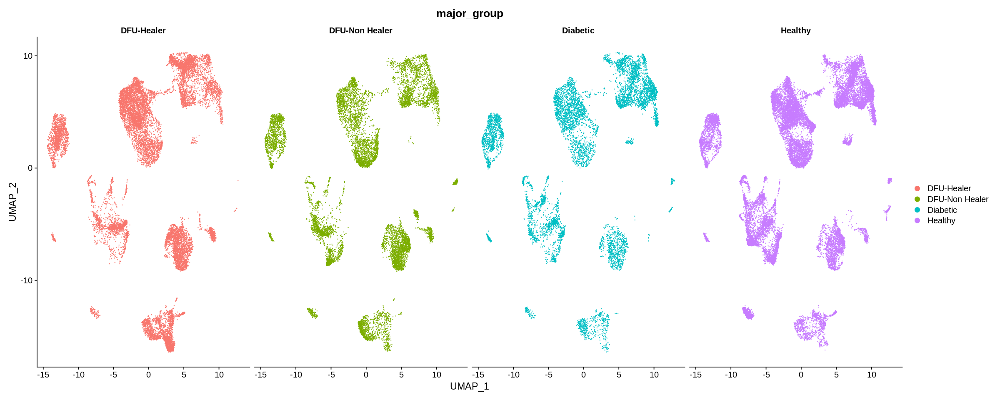

In [14]:
# Set the size of the UMAP plots
options(repr.plot.width = 20, repr.plot.height = 8)
# Create separate UMAP plots for each major group
DimPlot(DFU_Data.integrated, group.by = "major_group", split.by = "major_group")

In [15]:
DFU_Data.integrated <- FindNeighbors(DFU_Data.integrated, dims = 1:50)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 63190
Number of edges: 2624901

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9936
Number of communities: 10
Elapsed time: 14 seconds


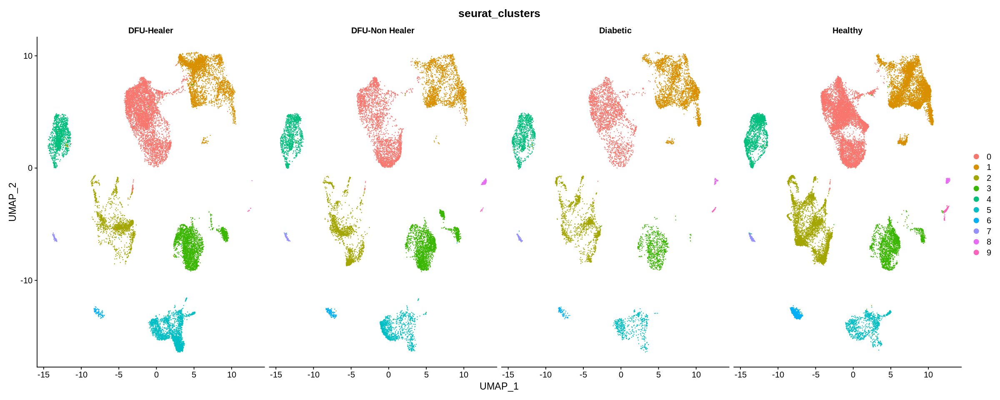

In [16]:
options(repr.plot.width = 20, repr.plot.height = 8)
DFU_Data.integrated <- FindClusters(DFU_Data.integrated, resolution = 0.02)  # can adjust the resolution parameter
DimPlot(DFU_Data.integrated, group.by = 'seurat_clusters', split.by = "major_group")

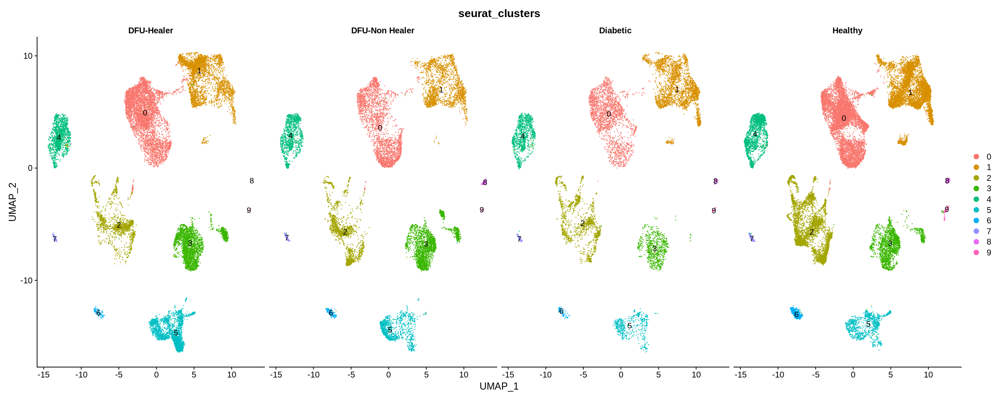

In [17]:
DimPlot(DFU_Data.integrated, 
        group.by = 'seurat_clusters', 
        split.by = "major_group", 
        label = TRUE) # Add labels to clusters


#Find markers

In [18]:
all.markers <- FindAllMarkers(object = DFU_Data.integrated)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



In [19]:
head(x = all.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
ACTA2,0,5.014317,0.996,0.959,0,0,ACTA2
RGS5,0,4.521567,0.980,0.872,0,0,RGS5
TAGLN,0,4.304464,0.999,0.954,0,0,TAGLN
MYL9,0,3.496722,0.998,0.936,0,0,MYL9
NDUFA4L2,0,3.280475,0.985,0.865,0,0,NDUFA4L2
TPM2,0,3.170849,0.989,0.935,0,0,TPM2


In [20]:
all.markers 

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
ACTA2,0,5.014317,0.996,0.959,0,0,ACTA2
RGS5,0,4.521567,0.980,0.872,0,0,RGS5
TAGLN,0,4.304464,0.999,0.954,0,0,TAGLN
MYL9,0,3.496722,0.998,0.936,0,0,MYL9
NDUFA4L2,0,3.280475,0.985,0.865,0,0,NDUFA4L2
TPM2,0,3.170849,0.989,0.935,0,0,TPM2
MYLK,0,2.831744,0.979,0.794,0,0,MYLK
SYNPO2,0,2.805431,0.956,0.729,0,0,SYNPO2
RGS16,0,2.614135,0.914,0.639,0,0,RGS16


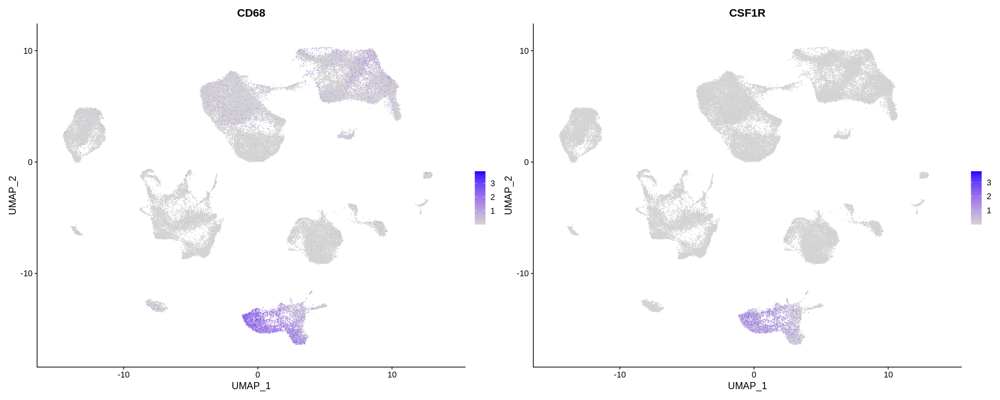

In [21]:
FeaturePlot(DFU_Data.integrated, features = c('CD68', 'CSF1R'), min.cutoff = "q9") #min.cutoff = "q9",effectively visualizing the top 10% of expression values

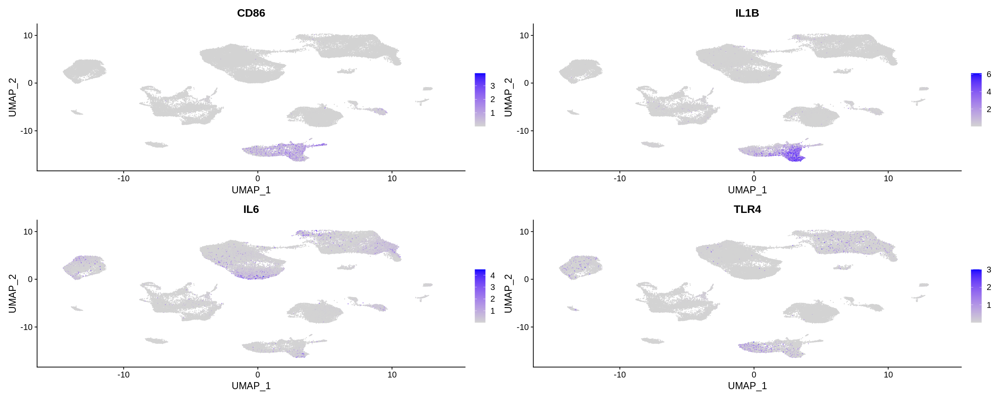

In [22]:
FeaturePlot(DFU_Data.integrated, features = c('CD86', 'IL1B', 'IL6','TLR4'), min.cutoff = "q9")

Warning message:
“Could not find CD79A in the default search locations, found in RNA assay instead”
Warning message:
“Could not find MS4A1 in the default search locations, found in RNA assay instead”


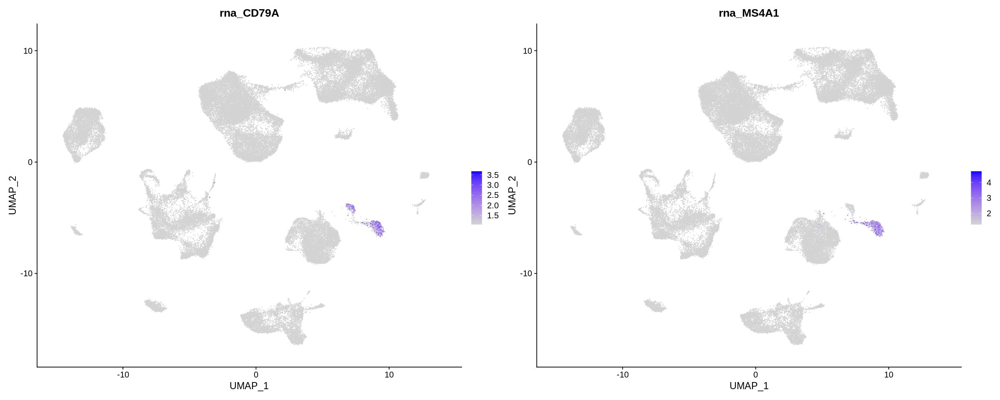

In [23]:
FeaturePlot(DFU_Data.integrated, features = c('CD79A', 'MS4A1'), min.cutoff = "q9") #b cell

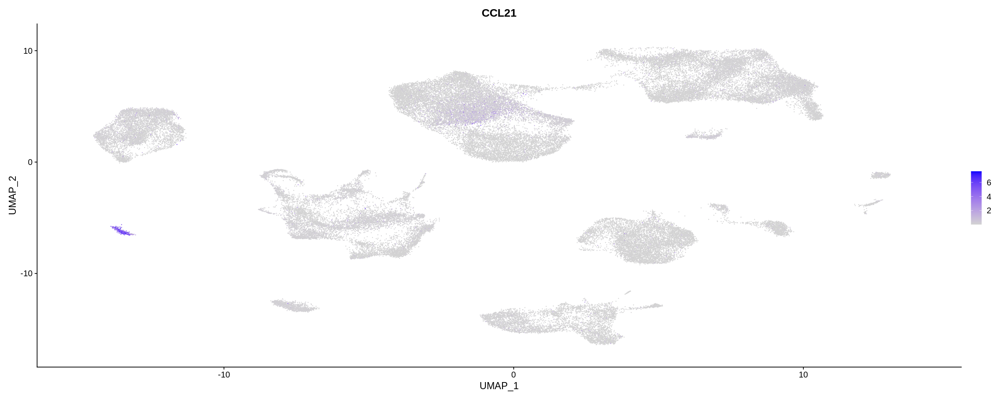

In [24]:
FeaturePlot(DFU_Data.integrated, features = c('CCL21'),min.cutoff = "q9") #LymphEndo

Warning message:
“Could not find MZB1 in the default search locations, found in RNA assay instead”


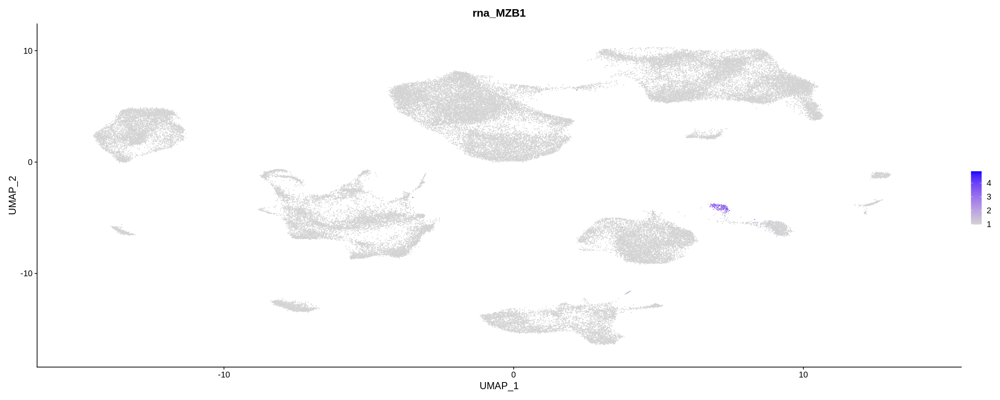

In [25]:
FeaturePlot(DFU_Data.integrated, features = c('MZB1'),min.cutoff = "q9") 

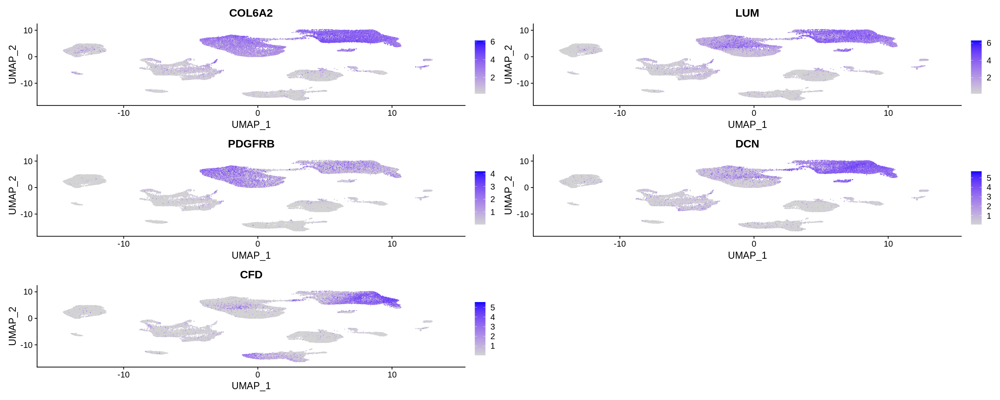

In [26]:
FeaturePlot(DFU_Data.integrated, features = c('COL6A2', 'LUM','PDGFRB','DCN','CFD'), min.cutoff = "q9") #Fibroblast

Warning message:
“Could not find FOXD2 in the default search locations, found in RNA assay instead”
Warning message:
“Could not find VIT in the default search locations, found in RNA assay instead”


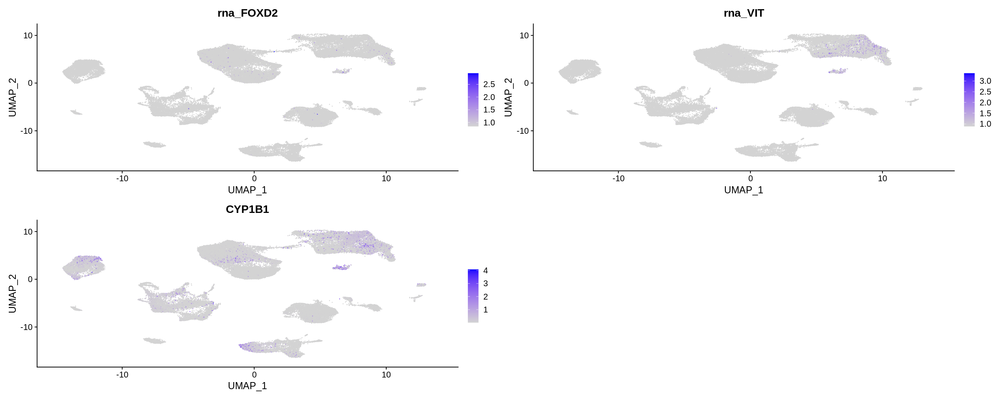

In [27]:
FeaturePlot(DFU_Data.integrated, features = c('FOXD2', 'VIT','CYP1B1'), min.cutoff = "q9") #Fibroblast

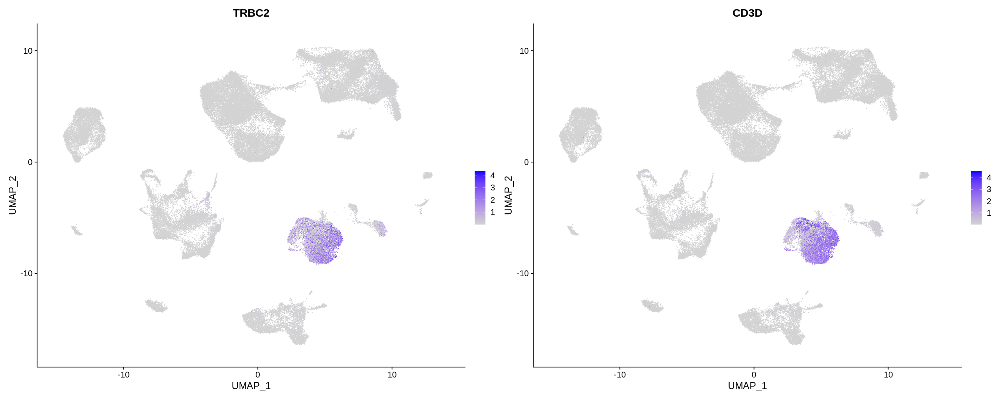

In [28]:
FeaturePlot(DFU_Data.integrated, features = c('TRBC2', 'CD3D'), min.cutoff = "q9") #Tcell

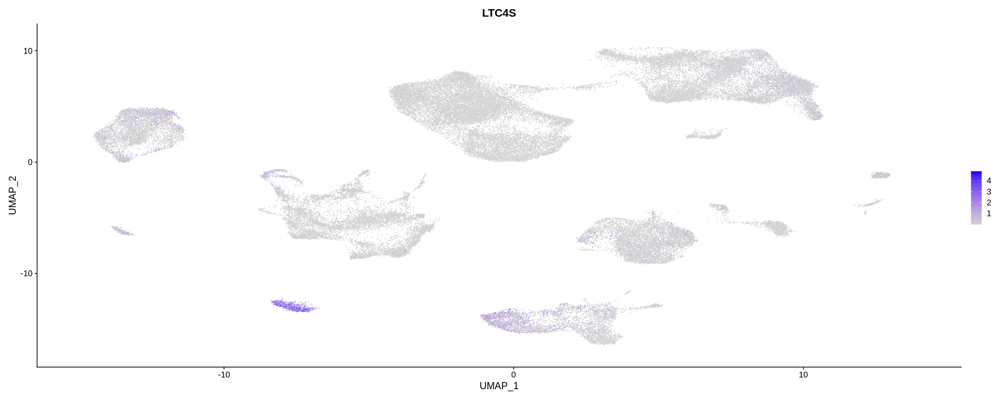

In [29]:
FeaturePlot(DFU_Data.integrated, features = c('LTC4S'), min.cutoff = "q9") #Mast cell

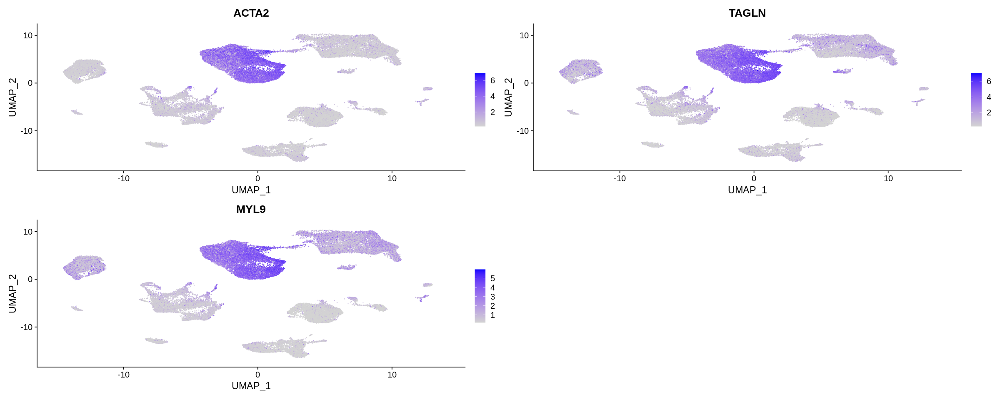

In [30]:
FeaturePlot(DFU_Data.integrated, features = c('ACTA2','TAGLN','MYL9'), min.cutoff = "q9") #SMC

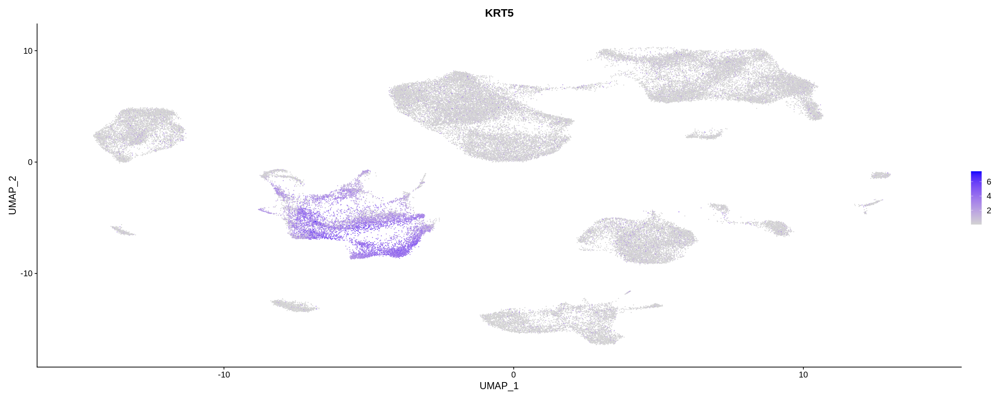

In [31]:
FeaturePlot(DFU_Data.integrated, features = c('KRT5'), min.cutoff = "q9") #Basalkera

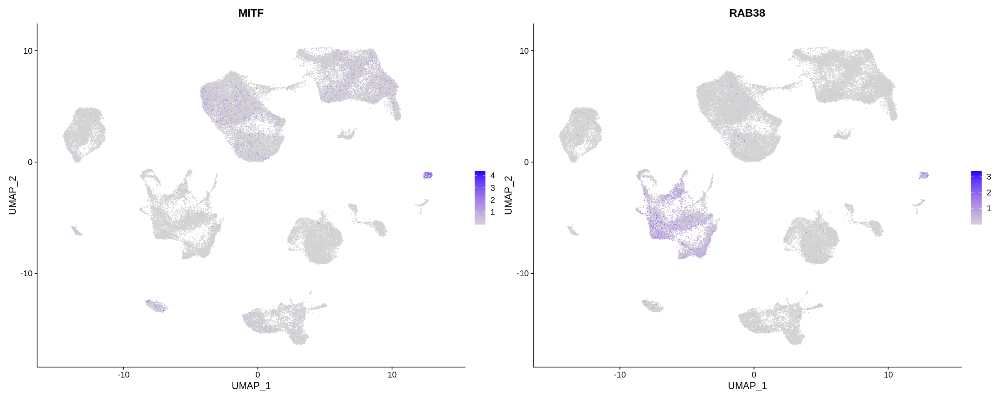

In [32]:
FeaturePlot(DFU_Data.integrated, features = c('MITF','RAB38'), min.cutoff = "q9") #Melanocytes

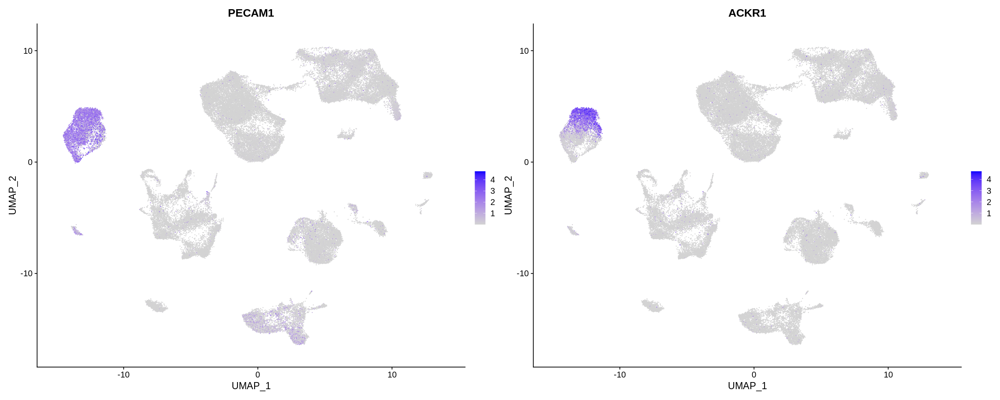

In [33]:
FeaturePlot(DFU_Data.integrated, features = c('PECAM1', 'ACKR1'), min.cutoff = "q9")

In [34]:
markers <- FindMarkers(DFU_Data.integrated, ident.1 = 7)

In [35]:
markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL21,0.000000e+00,7.6227600,0.992,0.702,0.000000e+00
MYCT1,0.000000e+00,1.9562556,0.981,0.439,0.000000e+00
C6orf141,1.276661e-299,0.9674041,0.872,0.113,2.553322e-296
EFNA5,2.574622e-299,1.7431896,0.983,0.336,5.149245e-296
CNTNAP3B,1.771099e-298,1.2211879,0.972,0.212,3.542198e-295
PDPN,6.722185e-293,2.5568563,0.987,0.618,1.344437e-289
TMEM100,1.259434e-291,1.5603586,0.985,0.615,2.518867e-288
SNCA,4.013062e-291,1.4037438,0.985,0.483,8.026124e-288
RASGRP3,3.853616e-282,1.7702876,0.966,0.612,7.707232e-279
